<a href="https://colab.research.google.com/github/azfarkhoja305/GANs/blob/wgangp-eps-loss/notebooks/DC_GAN_CIFAR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

DC GAN adopted from https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

Calculates FID score in PyTorch

In [1]:
import os
import sys
from pathlib import Path
import pdb

Path.ls = lambda x: list(x.iterdir())

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from tqdm.auto import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torchsummary import summary

In [3]:
!git clone https://github.com/azfarkhoja305/GANs.git

Cloning into 'GANs'...
remote: Enumerating objects: 161, done.
remote: Counting objects: 100% (161/161), done.
remote: Compressing objects: 100% (113/113), done.
remote: Total 161 (delta 81), reused 107 (delta 47), pack-reused 0
Receiving objects: 100% (161/161), 25.31 MiB | 20.22 MiB/s, done.
Resolving deltas: 100% (81/81), done.


In [4]:
if Path('./GANs').exists():
    sys.path.insert(0,'./GANs')

In [5]:
!python ./GANs/create_fid_stats.py -d cifar_10 -t False

Namespace(dataset='cifar_10', save='fid_stats', train='False')
170499072it [00:03, 49488615.16it/s]                   
Extracting data/cifar_10/cifar-10-python.tar.gz to data/cifar_10
Downloading: "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/pt_inception-2015-12-05-6726825d.pth
100% 91.2M/91.2M [00:01<00:00, 67.6MB/s]
100% 100/100 [00:32<00:00,  3.08it/s]
done


In [6]:
from datasets import ImageDataset
from utils.utils import check_gpu, display_images

In [7]:
%load_ext autoreload
%autoreload 2

In [8]:
device = check_gpu()
print(f'Using device: {device}')

Using device: cuda


In [9]:
dataset =  ImageDataset('cifar_10', batch_sz = 256)

Files already downloaded and verified


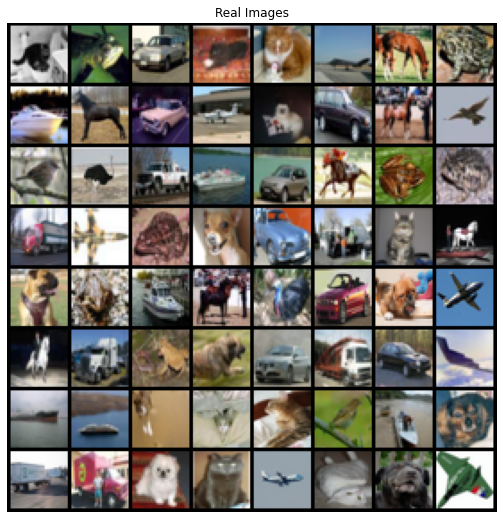

In [10]:
display_images(dataset.train_loader)

In [11]:
from models.generator import Generator
Gen = Generator().to(device)
# summary(Gen,(128,1))

In [12]:
# ViT Discriminator
from models.ViT_discriminator import Discriminator
from types import SimpleNamespace
args = SimpleNamespace(**{"d_depth": 7, "df_dim": 384, "img_size": 32, "patch_size": 8})
Dis = Discriminator(args).to(device)
# summary(Dis,(3,32,32))

In [13]:
# wgangp-eps loss
def compute_loss(dis_net, real_imgs, fake_imgs, phi, real_validity, fake_validity):
    gradient_penalty = compute_gradient_penalty(
        dis_net, real_imgs, fake_imgs.detach(), phi
    )
    d_loss = (
        -torch.mean(real_validity)
        +torch.mean(fake_validity)
        +gradient_penalty * 10 / (phi ** 2)
    )
    d_loss += (torch.mean(real_validity) ** 2) * 1e-3
    return d_loss


def compute_gradient_penalty(D, real_samples, fake_samples, phi):
    """Calculates the gradient penalty loss for WGAN GP"""
    # Random weight term for interpolation between real and fake samples
    alpha = torch.Tensor(np.random.random((real_samples.size(0), 1, 1, 1))).to(
        real_samples.get_device()
    )
    # Get random interpolation between real and fake samples
    interpolates = (alpha * real_samples + ((1 - alpha) * fake_samples)).requires_grad_(
        True
    )
    d_interpolates = D(interpolates)
    fake = torch.ones([real_samples.shape[0], 1], requires_grad=False).to(
        real_samples.get_device()
    )
    # Get gradient w.r.t. interpolates
    gradients = torch.autograd.grad(
        outputs=d_interpolates,
        inputs=interpolates,
        grad_outputs=fake,
        create_graph=True,
        retain_graph=True,
        only_inputs=True,
    )[0]
    gradients = gradients.view(gradients.size(0), -1)
    gradient_penalty = ((gradients.norm(2, dim=1) - phi) ** 2).mean()
    return gradient_penalty

In [14]:
loss_fn = nn.BCEWithLogitsLoss()
fixed_noise = torch.randn(64, 128, device=device)
real_label = 1.
fake_label = 0.
lr,beta1 = 3e-4, 0
optG = optim.AdamW(Gen.parameters(), lr=lr, betas=(beta1, 0.999))
optD = optim.AdamW(Dis.parameters(), lr=lr, betas=(beta1, 0.999))

In [15]:
img_list = []
G_losses = []
D_losses = []
iters = 0

# Number of training epochs
num_epochs = 30

In [16]:
for epoch in range(num_epochs):
    for i, data in enumerate(dataset.train_loader):

        ## Train with all-real batch
        Dis.zero_grad()
        # Format batch
        real = data[0].to(device)
        b_size = real.size(0)
        real_validity = torch.full(
            (b_size,), real_label, dtype=torch.float, device=device
        )
        # Forward pass real batch through D
        output_real = Dis(real).view(-1)

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, 128, 1, 1, device=device)
        # Generate fake image batch with G
        fake = Gen(noise)
        fake_validity = torch.full_like(real_validity, fake_label)
        # Classify all fake batch with D
        output_fake = Dis(fake.detach()).view(-1)

        errD = compute_loss(Dis, real, fake, 1.0, output_real, output_fake)

        errD.backward()

        torch.nn.utils.clip_grad_norm_(Dis.parameters(), 5.0)

        # Update D
        optD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        Gen.zero_grad()
        label = torch.full_like(
            real_validity, real_label
        )  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = Dis(fake).view(-1)
        # Calculate G's loss based on this output
        errG = loss_fn(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = torch.sigmoid(output).mean().item()
        # Update G
        optG.step()

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())


        # Output training stats
        if (i+1) %100 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f'
                % (epoch, num_epochs, i, len(dataset.train_loader),
                     errD.item(), errG.item()))

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataset.train_loader)-1)):
            with torch.no_grad():
                fake = Gen(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters +=1
             

[0/30][99/196]	Loss_D: 0.8274	Loss_G: 1.6293
[1/30][99/196]	Loss_D: -0.0532	Loss_G: 0.3977
[2/30][99/196]	Loss_D: 0.3454	Loss_G: 0.7026
[3/30][99/196]	Loss_D: 0.2494	Loss_G: 1.0561
[4/30][99/196]	Loss_D: 0.1855	Loss_G: 0.8164
[5/30][99/196]	Loss_D: -0.1296	Loss_G: 1.2205
[6/30][99/196]	Loss_D: 0.1083	Loss_G: 1.1076
[7/30][99/196]	Loss_D: 0.2025	Loss_G: 0.9574
[8/30][99/196]	Loss_D: 0.1302	Loss_G: 0.9650
[9/30][99/196]	Loss_D: -0.0956	Loss_G: 1.4610
[10/30][99/196]	Loss_D: -0.2979	Loss_G: 1.3967
[11/30][99/196]	Loss_D: -0.1769	Loss_G: 1.6034
[12/30][99/196]	Loss_D: -0.2436	Loss_G: 1.6034
[13/30][99/196]	Loss_D: -0.4937	Loss_G: 1.3155
[14/30][99/196]	Loss_D: -0.3142	Loss_G: 1.6209
[15/30][99/196]	Loss_D: -0.4039	Loss_G: 1.4490
[16/30][99/196]	Loss_D: -0.4238	Loss_G: 1.6900
[17/30][99/196]	Loss_D: -0.4595	Loss_G: 1.8172
[18/30][99/196]	Loss_D: -0.2314	Loss_G: 1.1361
[19/30][99/196]	Loss_D: -0.4623	Loss_G: 1.5840
[20/30][99/196]	Loss_D: -0.3499	Loss_G: 1.8739
[21/30][99/196]	Loss_D: -0.351

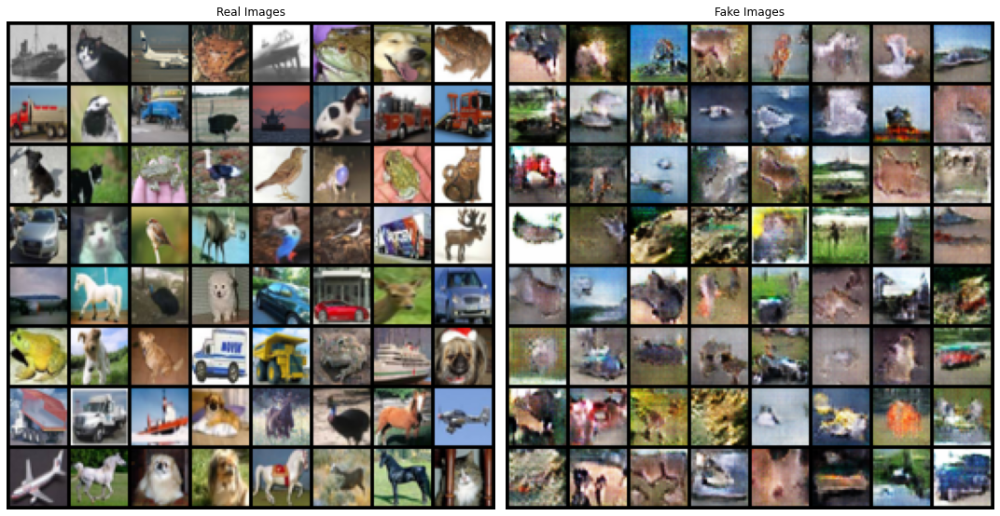

In [17]:
_, axs = plt.subplots(1,2,figsize=(15,15))
display_images(dataset.train_loader,ax = axs[0])
display_images(img_list, ax = axs[1])
plt.tight_layout()

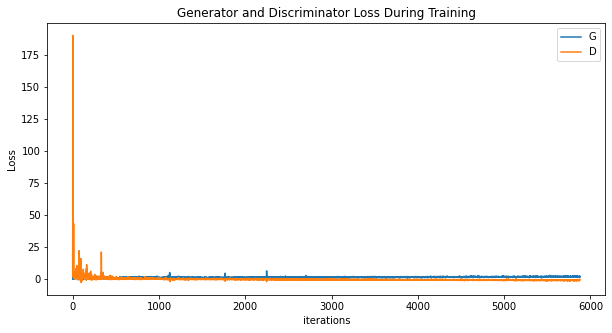

In [18]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

Calculating FID Score

In [19]:
from utils.torch_fid_score import get_fid

In [20]:
stat_path = Path('fid_stats/cifar_10_valid_fid_stats.npz')
score = get_fid(Gen, 128, 10000, 256, stat_path)
print(f"\nFID score: {score}")

Propagating batch 100/100
done

FID score: 71.6124267578125


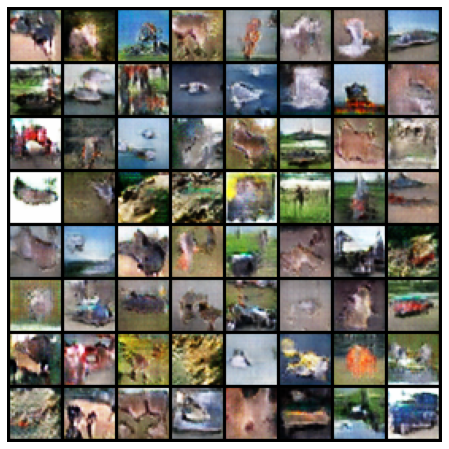

In [21]:
rc('animation', html='jshtml')
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
ani